In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


In [2]:
df = pd.read_excel('local/data/compras.xlsx')
print(df.shape)

(58693, 23)


## **Limpieza de Datos**
Vamos a estandatizar los nombres de las columnas 

In [3]:
df.columns = df.columns.str.replace(' ', '_')
df.columns = df.columns.str.strip()
df.columns = df.columns.str.lower()


Vamos a verificar que no existan valores faltantes, si bien en el archivo se indica que fueron tratados.

In [4]:
df.isna().sum()

id                    0
dia                   0
incidencia            0
marca                 0
cantidad              0
ultima_venta_marca    0
precio_1              0
precio_2              0
precio_3              0
precio_4              0
precio_5              0
promocion_1           0
promocion_2           0
promocion_3           0
promocion_4           0
promocion_5           0
sexo                  0
estado_civil          0
edad                  0
educacion             0
ingreso               0
ocupacion             0
tamaño_ciudad         0
dtype: int64

Estudiemos el tipo de datos que vamos a analizar

Vamos a transformar las variables 'edad' e 'ingreso' aplicando la función logaritmo para determinar si se pueden normalizar dichas variables.

In [7]:
df['edad_log'] = np.log(df['edad'])
df['ingreso_log'] = np.log(df['ingreso'])

In [8]:
df.head()

,id,dia,incidencia,marca,cantidad,ultima_venta_marca,precio_1,precio_2,precio_3,precio_4,...,promocion_5,sexo,estado_civil,edad,educacion,ingreso,ocupacion,tamaño_ciudad,edad_log,ingreso_log
0,200000001,1,0,0,0,0,1.59,1.87,2.01,2.09,...,0,0,0,47,1,110866,1,0,3.850148,11.616078
1,200000001,11,0,0,0,0,1.51,1.89,1.99,2.09,...,0,0,0,47,1,110866,1,0,3.850148,11.616078
2,200000001,12,0,0,0,0,1.51,1.89,1.99,2.09,...,0,0,0,47,1,110866,1,0,3.850148,11.616078
3,200000001,16,0,0,0,0,1.52,1.89,1.98,2.09,...,0,0,0,47,1,110866,1,0,3.850148,11.616078
4,200000001,18,0,0,0,0,1.52,1.89,1.99,2.09,...,0,0,0,47,1,110866,1,0,3.850148,11.616078


In [9]:
df[df['incidencia'] != 0 ]

,id,dia,incidencia,marca,cantidad,ultima_venta_marca,precio_1,precio_2,precio_3,precio_4,...,promocion_5,sexo,estado_civil,edad,educacion,ingreso,ocupacion,tamaño_ciudad,edad_log,ingreso_log
6,200000001,28,1,2,2,0,1.50,1.90,1.99,2.09,...,0,0,0,47,1,110866,1,0,3.850148,11.616078
11,200000001,58,1,5,1,0,1.39,1.90,1.91,2.12,...,1,0,0,47,1,110866,1,0,3.850148,11.616078
19,200000001,110,1,1,2,0,1.47,1.90,1.99,1.97,...,0,0,0,47,1,110866,1,0,3.850148,11.616078
24,200000001,142,1,4,1,0,1.21,1.35,1.99,2.16,...,0,0,0,47,1,110866,1,0,3.850148,11.616078
29,200000001,183,1,2,3,0,1.46,1.88,1.97,1.89,...,1,0,0,47,1,110866,1,0,3.850148,11.616078
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58621,200000500,296,1,2,6,0,1.48,1.89,2.01,2.18,...,0,0,0,42,1,120946,1,0,3.737670,11.703099
58648,200000500,460,1,1,12,0,1.35,1.57,2.02,2.21,...,0,0,0,42,1,120946,1,0,3.737670,11.703099
58674,200000500,641,1,2,7,0,1.50,1.85,2.06,2.24,...,0,0,0,42,1,120946,1,0,3.737670,11.703099
58687,200000500,697,1,2,6,0,1.42,1.51,1.97,2.24,...,0,0,0,42,1,120946,1,0,3.737670,11.703099


## **2. Análisis**

### **2.a) Cálculo de las variables recencia, frecuencia y valor monetario**

### **Cálculo de la variable Recencia**

In [24]:
recen = 731 - df.groupby('id', sort=True).max()['dia']

recencia = pd.DataFrame(recen).reset_index()
recencia

,id,dia
0,200000001,4
1,200000002,2
2,200000003,7
3,200000004,6
4,200000005,2
...,...,...
495,200000496,8
496,200000497,9
497,200000498,2
498,200000499,4


In [25]:
#recencia.to_excel('recencia.xlsx')

### **Cálculo de la variable Frecuencia**

In [26]:
frec = df.groupby('id', sort=True).count()['cantidad']

frecuencia = pd.DataFrame(frec).reset_index()
frecuencia

,id,cantidad
0,200000001,101
1,200000002,87
2,200000003,97
3,200000004,85
4,200000005,111
...,...,...
495,200000496,120
496,200000497,120
497,200000498,131
498,200000499,106


In [27]:
#frecuencia.to_excel('frecuencia.xlsx')

### **Cálculo de la variable Valor Monetario**
Inicialmente vamos a determinar los clientes que han comprado alguno de los 5 tipos de chocolates que estamos interesados en analizar.

In [28]:
inci_1 = df[(df['incidencia'] != 0) & (df['marca'] == 1)]

inci_1_c = inci_1.copy()
inci_1_c['total_compras_p1'] = inci_1_c.loc[:, 'cantidad'] * inci_1_c.loc[:, 'precio_1']
VM_1 = inci_1_c.groupby('id', sort = True).sum()['total_compras_p1']

In [29]:
inci_2 = df[(df['incidencia'] != 0) & (df['marca'] == 2)]

inci_2_c = inci_2.copy()
inci_2_c['total_compras_p2'] = inci_2_c.loc[:, 'cantidad'] * inci_2_c.loc[:, 'precio_2']
VM_2 = inci_2_c.groupby('id', sort = True).sum()['total_compras_p2']

In [30]:
inci_3 = df[(df['incidencia'] != 0) & (df['marca'] == 3)]

inci_3_c = inci_3.copy()
inci_3_c['total_compras_p3'] = inci_3_c.loc[:, 'cantidad'] * inci_3_c.loc[:, 'precio_3']
VM_3 = inci_3_c.groupby('id', sort = True).sum()['total_compras_p3']

In [31]:
inci_4 = df[(df['incidencia'] != 0) & (df['marca'] == 4)]

inci_4_c = inci_4.copy()
inci_4_c['total_compras_p4'] = inci_4_c.loc[:, 'cantidad'] * inci_4_c.loc[:, 'precio_4']
VM_4 = inci_4_c.groupby('id', sort = True).sum()['total_compras_p4']

In [32]:
inci_5 = df[(df['incidencia'] != 0) & (df['marca'] == 5)]

inci_5_c = inci_5.copy()
inci_5_c['total_compras_p5'] = inci_5_c.loc[:, 'cantidad'] * inci_5_c.loc[:, 'precio_5']
VM_5 = inci_5_c.groupby('id', sort = True).sum()['total_compras_p5']

In [33]:
series_VM = [VM_1, VM_2, VM_3, VM_4, VM_5]

VM = pd.concat(series_VM, axis = 1)
VM = VM.fillna(0)
VM['valores_monetarios'] = VM['total_compras_p1'] + VM['total_compras_p2'] + VM['total_compras_p3'] + VM['total_compras_p4'] + VM['total_compras_p5']
VM = VM.reset_index()
VM

,id,total_compras_p1,total_compras_p2,total_compras_p3,total_compras_p4,total_compras_p5,valores_monetarios
0,200000001,2.94,17.75,0.00,7.86,5.41,33.96
1,200000002,0.00,4.71,0.00,37.03,0.00,41.74
2,200000003,0.00,27.34,0.00,0.00,4.93,32.27
3,200000004,0.00,1.57,0.00,0.00,31.39,32.96
4,200000005,0.00,0.00,0.00,0.00,54.97,54.97
...,...,...,...,...,...,...,...
495,200000496,2.98,62.47,0.00,3.78,21.30,90.53
496,200000497,4.76,305.55,0.00,147.30,2.70,460.31
497,200000498,18.48,133.55,67.62,0.00,0.00,219.65
498,200000499,8.01,127.25,0.00,6.72,15.87,157.85


In [34]:
#VM.to_excel('valor_monetario.xlsx')

### **2.b) Generación de segmentos con las variables recencia, frecuencia y valor monetario**

Veamos la distribución de la recencia, frecuencia y valor monetario

In [35]:
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles = ('Recencia', 'Frecuencia', 
                    'Valores Monetarios'),
    specs=[[{"type": "histogram"}, {"type": "histogram"}],
           [{"type": "histogram"}, {"type": "histogram"}]],
)

fig.add_trace(go.Histogram(x = recencia['dia'], nbinsx = 3),
              row=1, col=1)

fig.add_trace(go.Histogram(x = frecuencia['cantidad'], nbinsx = 2),
              row=1, col=2)

fig.add_trace(go.Histogram(x = VM['valores_monetarios'], nbinsx = 2),
              row=2, col=1)

fig.update_layout(height=1000, showlegend=False)

fig.show()

Ahora generemos los puntos de corte para cada una de las variables de interés

Definimos las siguientes funciones para calcular los extremos (puntos de corte) e intervalos de cada segmento que vamos a generar

In [36]:
def puntos_corte(X,n):
    extremos = []

    for i in range(n+1):
        extremos.append(int(X.min() + i*(X.max() - X.min())/ n) )
    return extremos

def intervalos(X, Y, a, i):
    return X[(Y >= a[i]) & (Y < a[i + 1])]

### **Puntos de corte**

In [37]:
pc_rec = puntos_corte(recencia['dia'], 3)
pc_frec = puntos_corte(frecuencia['cantidad'], 2)
pc_VM = puntos_corte(VM['valores_monetarios'], 2)

print(pc_rec)
print(pc_frec)
print(pc_VM)

[1, 10, 19, 28]
[72, 215, 358]
[17, 938, 1859]


### **Segmentos**
Con los puntos de corte generados previamente, construimos los extremos de los intervalos. Se decidió cosiderar 5 intervalos de forma subjetiva para asociar un ranking de 1 a 5, es posible realizar un proceso más exhastivo observandola distribución de cada una de las variables para así poder asociar una función más adecuada para la forma de los datos, lo cual se podrírealizar un futuras ocasiones para refinar el análisis.

Vamos a construir los segmetos de la siguiente manera: 

Para la variable recencia tenemos los intervalos $R_1 = [1,10)$, $R_2 = [10,19)$ y $R_3 = [19,28]$.

Para la variable frecuencia tenemos los intervalos $F_1 = [72,215)$ y $F_2 = [215,358]$.

Para la variable valor monetario tenemos los intervalos $VM_1 = [17,938)$ y $VM_2 = [938,1859]$.

Con los anteriores intervalos de cada variable de interés vamos a construir los siguientes segmentos de clientes.

Segmento 1: $R_1-F_1-VM_1$

Segmento 2: $R_1-F_1-VM_2$

Segmento 3: $R_1-F_2-VM_2$

Segmento 4: $R_2-F_1-VM_1$

Segmento 5: $R_3-F_1-VM_1$

Segmento 6: $R_3-F_2-VM_2$

### **Descripción de los segmentos**

Segmento 1: **Mejores clientes**

Son clientes que tardan pocos días en volver a comprar, compran de forma frecuente a la empresa y gastan bastante dinero en productos ofertados por la empresa.

Segmento 2:	**Leales**	

Son clientes que tardan pocos días en volver a comprar, compran de forma frecuente a la empresa, pero que gastan poco dinero cuando compran productos a la empresa.

Segmento 3:	**Tímidos**	

Son clientes que tardan pocos días en volver a comprar, pero no compran una gran catidad de productos y además no gastan grandes cantidades de dinero en chocolates.

Segmento 4:	**Potenciales**

Son clientes que tardan varios días (entre 11 y 19 días para volver a comprar en la empresa, pero que cuando visitan la emrpesa compran gran cantidad de chocolates e invierten grandes cantidades de dinero en los productos.

Segmento 5:	**Recuperables**	

Son clientes que tardan varios días (entre 19 y 28 días para volver a comprar en la empresa, pero que cuando visitan la emrpesa compran gran cantidad de chocolates e invierten grandes cantidades de dinero en los productos.

Segmento 6:	**Perdidos**	

Son clientes que tardan varios días en volver al negocio pero no compran, ni gastan dinero en los productos que estamos interesados en analizar (chocolates).



In [38]:
#Segmento 1

inter_rec1 = intervalos(recencia, recencia['dia'], pc_rec, 0)
inter_frec1 = intervalos(frecuencia, frecuencia['cantidad'], pc_frec, 0)
inter_VM1 = intervalos(VM, VM['valores_monetarios'], pc_VM, 0)

#Segmento 2

inter_rec1 = intervalos(recencia, recencia['dia'], pc_rec, 0)
inter_frec1 = intervalos(frecuencia, frecuencia['cantidad'], pc_frec, 0)
inter_VM2 = intervalos(VM, VM['valores_monetarios'], pc_VM, 1)

#Segmento 3

inter_rec1 = intervalos(recencia, recencia['dia'], pc_rec, 0)
inter_frec2 = intervalos(frecuencia, frecuencia['cantidad'], pc_frec, 1)
inter_VM1 = intervalos(VM, VM['valores_monetarios'], pc_VM, 0)

#Segmento 4

inter_rec1 = intervalos(recencia, recencia['dia'], pc_rec, 0)
inter_frec2 = intervalos(frecuencia, frecuencia['cantidad'], pc_frec, 1)
inter_VM2 = intervalos(VM, VM['valores_monetarios'], pc_VM, 1)

#Segmento 5

inter_rec2 = intervalos(recencia, recencia['dia'], pc_rec, 1)
inter_frec1 = intervalos(frecuencia, frecuencia['cantidad'], pc_frec, 0)
inter_VM1 = intervalos(VM, VM['valores_monetarios'], pc_VM, 0)

#Segmento 6

inter_rec2 = intervalos(recencia, recencia['dia'], pc_rec, 1)
inter_frec1 = intervalos(frecuencia, frecuencia['cantidad'], pc_frec,0)
inter_VM2 = intervalos(VM, VM['valores_monetarios'], pc_VM, 1)

#Segmento 7

inter_rec2 = intervalos(recencia, recencia['dia'], pc_rec, 1)
inter_frec2 = intervalos(frecuencia, frecuencia['cantidad'], pc_frec, 1)
inter_VM1 = intervalos(VM, VM['valores_monetarios'], pc_VM, 0)

#Segmento 8

inter_rec2 = intervalos(recencia, recencia['dia'], pc_rec, 1)
inter_frec2 = intervalos(frecuencia, frecuencia['cantidad'], pc_frec, 1)
inter_VM2 = intervalos(VM, VM['valores_monetarios'], pc_VM, 1)

#Segmento 9

inter_rec3 = intervalos(recencia, recencia['dia'], pc_rec, 2)
inter_frec1 = intervalos(frecuencia, frecuencia['cantidad'], pc_frec, 0)
inter_VM1 = intervalos(VM, VM['valores_monetarios'], pc_VM, 0)

#Segmento 10

inter_rec3 = intervalos(recencia, recencia['dia'], pc_rec, 2)
inter_frec1 = intervalos(frecuencia, frecuencia['cantidad'], pc_frec, 0)
inter_VM2 = intervalos(VM, VM['valores_monetarios'], pc_VM, 1)

#Segmento 11

inter_rec3 = intervalos(recencia, recencia['dia'], pc_rec, 2)
inter_frec2 = intervalos(frecuencia, frecuencia['cantidad'], pc_frec, 1)
inter_VM1 = intervalos(VM, VM['valores_monetarios'], pc_VM, 0)

#Segmento 12

inter_rec3 = intervalos(recencia, recencia['dia'], pc_rec, 2)
inter_frec2 = intervalos(frecuencia, frecuencia['cantidad'], pc_frec,1)
inter_VM2 = intervalos(VM, VM['valores_monetarios'], pc_VM, 1)

In [39]:
def segmentos(X, Y, Z):
    lista = []
    for i in range(X.shape[0]):
        for j in range(Y.shape[0]):
            for k in range(Z.shape[0]):
                if (X.iloc[i,0] == Y.iloc[j,0]) & (X.iloc[i,0] == Z.iloc[k,0]) & (Y.iloc[j,0] == Z.iloc[k,0]):
                    lista.append(Y.iloc[j, 0])
    return pd.DataFrame(data = lista)

Aplicando la función 'segementos', vamos a construir los segmentos de clientes en cada una de nuestras combinaciones de nuestras variables de interés. Al generar todas las combinaciones onservamos que existen algunas que donde no recae ningún cliente, por lo tanto de las 12 combinaciones posibles, se obtienen 6 de interés.

In [40]:
#Si

#segmentos(inter_rec1, inter_frec1, inter_VM1).to_excel('S_1.xlsx')

In [41]:
#Si

#segmentos(inter_rec1, inter_frec1, inter_VM2).to_excel('S_2.xlsx')

In [42]:
#No

#segmentos(inter_rec1, inter_frec2, inter_VM1).to_excel('S_3.xlsx')

In [43]:
#Si

#segmentos(inter_rec1, inter_frec2, inter_VM2).to_excel('S_4.xlsx')

In [44]:
#Si

#segmentos(inter_rec2, inter_frec1, inter_VM1).to_excel('S_5.xlsx')

In [45]:
#No

#segmentos(inter_rec2, inter_frec2, inter_VM1).to_excel('S_6.xlsx')

In [46]:
#No

#segmentos(inter_rec2, inter_frec1, inter_VM2).to_excel('S_7.xlsx')

In [47]:
#No

#segmentos(inter_rec2, inter_frec2, inter_VM2).to_excel('S_8.xlsx')

In [48]:
#Si

#segmentos(inter_rec3, inter_frec1, inter_VM1).to_excel('S_9.xlsx')

In [49]:
#No

#segmentos(inter_rec3, inter_frec1, inter_VM2).to_excel('S_10.xlsx')

In [50]:
#No

#segmentos(inter_rec3, inter_frec2, inter_VM1).to_excel('S_11.xlsx')

In [51]:
#No

#segmentos(inter_rec3, inter_frec2, inter_VM2).to_excel('S_12.xlsx')

### **4. Insights para potenciar las operaciones que no generaron venta.**

In [52]:
df_s = pd.read_excel('local/data/segmentos.xlsx')

In [53]:
df_cc = pd.DataFrame(df.groupby('id', sort=True).count()['tamaño_ciudad'])
df_cc.to_excel('ciudades.xlsx')

In [54]:
df_sc = pd.read_excel('local/data/segmentos_ciudades.xlsx')
df_sc


,id,segmento,tamaño_ciudad
0,200000001,1,101
1,200000002,1,87
2,200000003,1,97
3,200000004,1,85
4,200000005,1,111
...,...,...,...
495,200000496,1,120
496,200000497,1,120
497,200000498,1,131
498,200000499,1,106


In [55]:
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles = ('Segmentos', 'Tamaño de Ciudad'),
    specs=[[{"type": "histogram"}, {"type": "histogram"}]],
)

fig.add_trace(go.Histogram(x=df_sc['segmento']),
              row=1, col=1)

fig.add_trace(go.Histogram(x = df_sc['tamaño_ciudad'], nbinsx = 6),
              row=1, col=2)


fig.update_layout(height=400, showlegend=False)

fig.show()

Vamos a tomar tres insights para potenciar las ventas de los chocolates

In [56]:
segmentos_ciudades = px.scatter(df_sc, x="segmento", y="tamaño_ciudad", color = 'segmento',
                    marginal_y = 'violin', marginal_x = 'box',
                    trendline="ols", template="simple_white") 
segmentos_ciudades.show()

## **Segmentación por Clustering**

Importamos las librerias

In [57]:
from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors

Vamos a seleccionar las características para generar los clusters.
Consideraremos las caracterísicas relacionadas con las ventas, tales como: 'quantityordered', 'priceeach', 'sales_log'

In [58]:
X = df[['cantidad', 'edad_log', 'ingreso_log']]

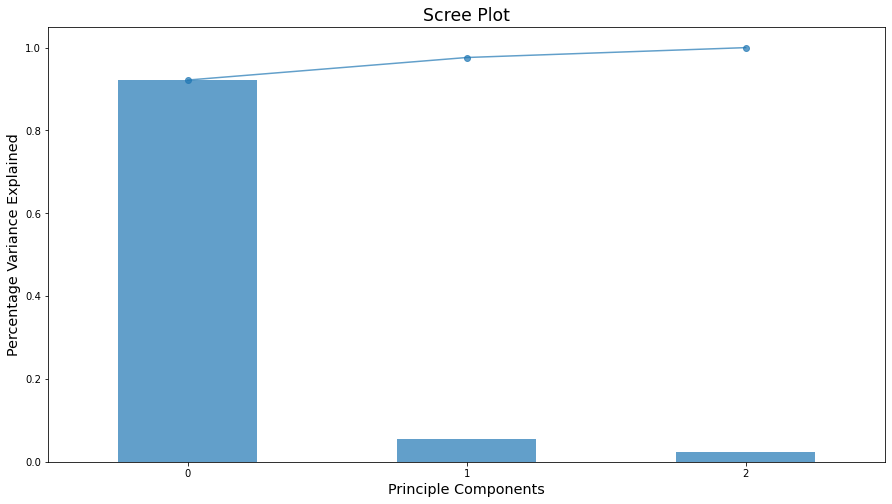

In [59]:
pca = PCA()
pca.fit(X)
sns.color_palette("YlOrBr", as_cmap=True)
plt.figure(figsize=(15,8))
exp_var = pd.Series(pca.explained_variance_ratio_) 
exp_var.plot(kind="bar", alpha=0.7) # plot bar chart

# Calculate the amount of variance explained added by each additional component
total = 0
var_ls = []
for x in exp_var:
    total = total+x
    var_ls.append(total)

pd.Series(var_ls).plot(marker="o", alpha=0.7) #plot line chart of increasing variances
plt.xlabel("Principle Components", fontsize="x-large")
plt.ylabel("Percentage Variance Explained", fontsize="x-large")
plt.title("Scree Plot", fontsize="xx-large")
plt.show();

In [60]:
pca = PCA(n_components=3)
X = pca.fit_transform(X)

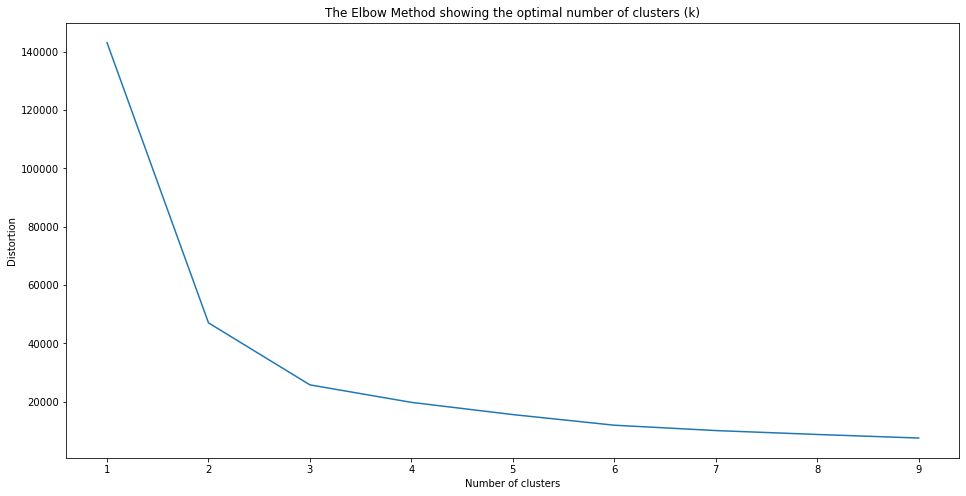

In [61]:
# Create Elbow Plot

w = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(X)
    w.append(kmeanModel.inertia_)

plt.figure(figsize=(16,8))
plt.plot(K, w)
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal number of clusters (k)')

plt.show()

In [62]:
# create a pipeline to scale data and 
# Apply KMeans 
kmean = KMeans(n_clusters=5)

kmean.fit(X)
y_pred = kmean.predict(X)
#joined_Users['pred_cluster'] = y_pred

In [63]:
# 3d Scatter plot of clusters using K-means

fig = px.scatter_3d(X, x= X[:,0], y= X[:,1],z = X[:,2],
                   color=y_pred, labels={'x':'Feature 1', 'y':'Feature 2','z':'Feature 3'} )
fig.show()

In [64]:
frames = [df['cantidad'], df['edad'], df['ingreso']]

df_c = pd.concat(frames, axis=1)
df_c['cluster'] = y_pred
df_c[df_c['cantidad'] != 0]

,cantidad,edad,ingreso,cluster
6,2,47,110866,1
11,1,47,110866,0
19,2,47,110866,1
24,1,47,110866,0
29,3,47,110866,1
...,...,...,...,...
58621,6,42,120946,4
58648,12,42,120946,2
58674,7,42,120946,2
58687,6,42,120946,4


In [65]:
fig = px.scatter_3d(df_c, x= df_c.iloc[:,0], y= df_c.iloc[:,1],z = df_c.iloc[:,2],
                   color=y_pred, labels={'x':'cantidad', 'y':'edad','z':'ingreso'} )
fig.show()